In [1]:
import torch
import torch.nn as nn
import torchvision
from torchvision import datasets, transforms
import os
import matplotlib.pyplot as plt
import numpy as np
import json
import pandas as pd
import math
from PIL import Image

##### Using super classes:

The following two cells respectively used the two methods in the email.

The first method still has more than 500 classes, so I didn't use it.  
However, for the second method:  
Although it has only 13 super-classes, they only include about 300 original classes, and the rest are not included. I have to put '\*' to the predictions which are not included in the 13 super-classes

In [2]:
# first method
super_class = pd.read_csv('imagenet_hierarchy_of_categories.csv', index_col=None)
super_class.head()

,ID,Category,Supercategory
0,n01440764,"tench, Tinca tinca","cyprinid, cyprinid fish"
1,n01443537,"goldfish, Carassius auratus","cyprinid, cyprinid fish"
2,n01484850,"great white shark, white shark, man-eater, man...",mackerel shark
3,n01491361,"tiger shark, Galeocerdo cuvieri",requiem shark
4,n01494475,"hammerhead, hammerhead shark",shark


In [3]:
# second method

# create a dataframe 'super_class' to map the subclasses to their superclasses
"""
from robustness.tools.imagenet_helpers import common_superclass_wnid
from robustness.tools.imagenet_helpers import ImageNetHierarchy

in_path = 'imagenet'
in_info_path = 'imagenet_info'
in_hier = ImageNetHierarchy(in_path, in_info_path)

superclass_wnid = common_superclass_wnid('mixed_13')
class_ranges, label_map = in_hier.get_subclasses(superclass_wnid,
                                                 balanced=False)

super_class = pd.DataFrame(columns = ['class', 'sup_class'])

for i, sub_classes in enumerate(class_ranges):
    for sub_class in sub_classes:
        new = pd.DataFrame({'class': sub_class, 'sup_class': label_map[i].split(',')[0]}, index = [1])
        super_class = super_class.append(new, ignore_index = True)
        
super_class = super_class.set_index('class')
super_class = super_class.sort_index()
super_class.to_csv('super_class.csv')
"""

super_class = pd.read_csv('super_class.csv', index_col = 'class')
super_class

,sup_class
class,
0,fish
1,fish
2,fish
3,fish
4,fish
...,...
994,fungus
995,fungus
996,fungus


In [4]:
# import pretrained models
alexnet = torchvision.models.alexnet(pretrained = True)
resnet = torchvision.models.resnet50(pretrained = True)
vgg = torchvision.models.vgg16(pretrained = True)

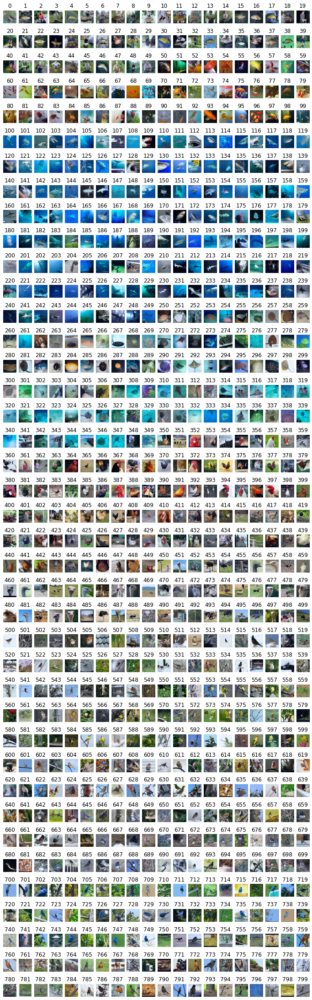

In [5]:
# import test data

normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

transform_ = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    normalize
])

folder_dir = 'imagenet/val_3'
data_test =  datasets.ImageFolder(root = folder_dir, transform = transform_,
                                       target_transform = None)

# show the test images

fig = plt.figure(figsize = (12, math.ceil(len(data_test)/20)))
fig.tight_layout()
for i in range(len(data_test)):
    img = data_test[i][0].permute(1, 2, 0)
    img_norm = (img - img.min()) / (img.max() - img.min())
    plt.subplot(math.ceil(len(data_test)/20), 20, i+1)
    plt.imshow(img_norm)
    plt.title(i)
    plt.axis('off')
plt.show()

In [6]:
# make prediction

pred_alexnet = []
pred_resnet = []
pred_vgg = []

alexnet.eval()
resnet.eval()
vgg.eval()

with open("imagenet_class_index.json") as f:
    imagenet_classes = {int(i):x[1] for i,x in json.load(f).items()}

# use super_class 
for data in iter(data_test):
    img = data[0].unsqueeze(0)
    
    pred = alexnet(img).max(dim=1)[1].item()
    # if the predictions are not included in the superclasses, put '*' near them
    try:
        pred_class = super_class.loc[pred].sup_class
        pred_alexnet.append(pred_class)
    except:
        pred_alexnet.append(str(imagenet_classes[pred]) + '*')

    pred = resnet(img).max(dim=1)[1].item()
    try:
        pred_class = super_class.loc[pred].sup_class
        pred_resnet.append(pred_class)
    except:
        pred_resnet.append(str(imagenet_classes[pred]) + '*')
    
    pred = vgg(img).max(dim=1)[1].item()
    try:
        pred_class = super_class.loc[pred].sup_class
        pred_vgg.append(pred_class)
    except:
        pred_vgg.append(str(imagenet_classes[pred]) + '*')

In [7]:
# record errors made

n_subclass = len(data_test.classes)
subclasses = list(imagenet_classes.values())[0:n_subclass]

err_alexnet = dict(map(lambda x: [x,[]], subclasses))
err_resnet = dict(map(lambda x: [x,[]], subclasses))
err_vgg = dict(map(lambda x: [x,[]], subclasses))

# use super_class 
for i in range(len(pred_alexnet)):
    if pred_alexnet[i] != super_class.loc[data_test[i][1]].sup_class:
    # if pred_alexnet[i] != imagenet_classes[data_test[i][1]]:
        err_alexnet[imagenet_classes[data_test[i][1]]].append((i, pred_alexnet[i]))
    if pred_resnet[i] != super_class.loc[data_test[i][1]].sup_class:
    # if pred_resnet[i] != imagenet_classes[data_test[i][1]]:
        err_resnet[imagenet_classes[data_test[i][1]]].append((i, pred_resnet[i]))
    if pred_vgg[i] != super_class.loc[data_test[i][1]].sup_class:
    # if pred_vgg[i] != imagenet_classes[data_test[i][1]]:
        err_vgg[imagenet_classes[data_test[i][1]]].append((i, pred_vgg[i]))

print('errors made by alexnet: ' + '\n')
print(err_alexnet)
print('\n' + 'errors made by resnet: ' + '\n')
print(err_resnet)
print('\n' + 'errors made by vgg: ' + '\n')
print(err_vgg)

errors made by alexnet: 

{'tench': [(1, 'rifle*'), (2, 'ice_lolly*'), (10, 'hermit_crab*'), (20, 'mountain_bike*'), (32, 'chain_saw*'), (35, 'cardigan*'), (36, 'alligator_lizard*')], 'goldfish': [(51, 'toaster*'), (54, 'shower_curtain*'), (55, 'stage*'), (59, 'bird'), (61, 'whistle*'), (64, 'eggnog*'), (67, 'snorkel*'), (68, "jack-o'-lantern*"), (73, 'insect'), (79, 'hermit_crab*'), (80, 'bathtub*'), (87, 'hand_blower*'), (96, 'fruit')], 'great_white_shark': [(107, 'trimaran*'), (112, 'airship*'), (114, 'killer_whale*'), (121, 'snorkel*'), (132, 'vending_machine*'), (134, 'loggerhead*'), (138, 'bird'), (139, 'killer_whale*'), (142, 'dugong*'), (145, 'weasel*')], 'tiger_shark': [(155, 'jellyfish*'), (158, 'scuba_diver*'), (167, 'scuba_diver*'), (175, 'grey_whale*'), (195, 'killer_whale*'), (196, 'jellyfish*'), (197, 'dugong*'), (199, 'dugong*')], 'hammerhead': [(200, 'bird'), (202, 'scuba_diver*'), (208, 'dog'), (215, 'monkey'), (236, 'scuba_diver*'), (237, 'butcher_shop*'), (245, 'wre


Errors made on tench by: 


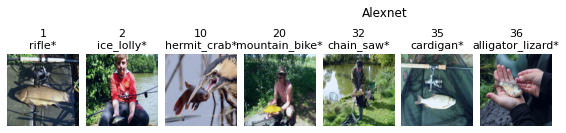

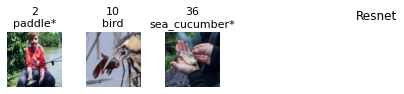

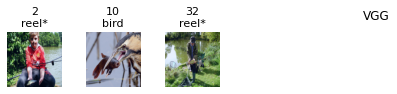


Errors made on goldfish by: 


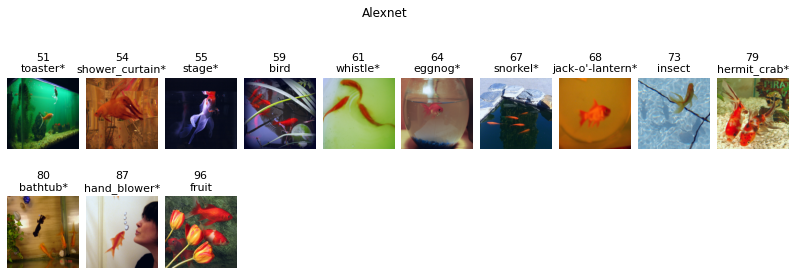

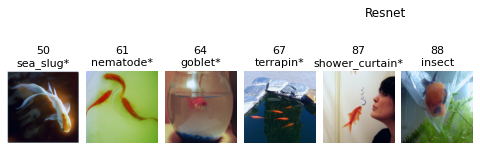

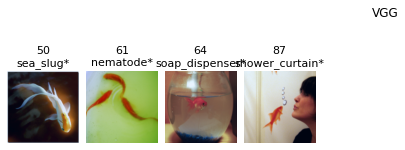


Errors made on great_white_shark by: 


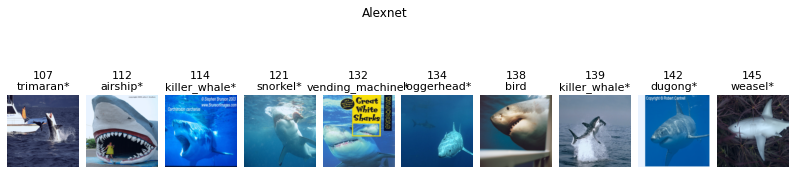

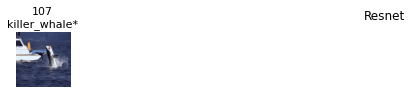

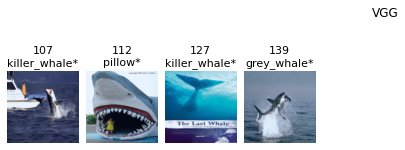


Errors made on tiger_shark by: 


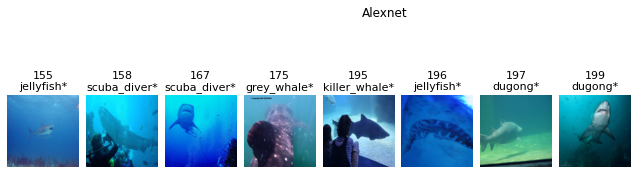

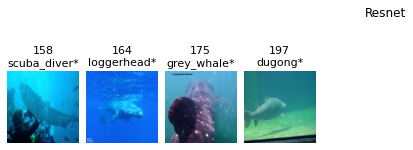

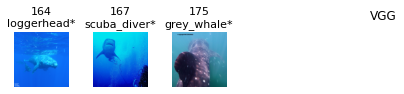


Errors made on hammerhead by: 


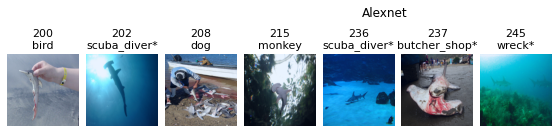

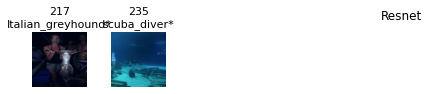

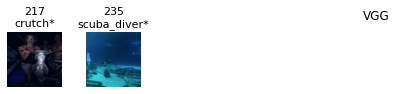


Errors made on electric_ray by: 


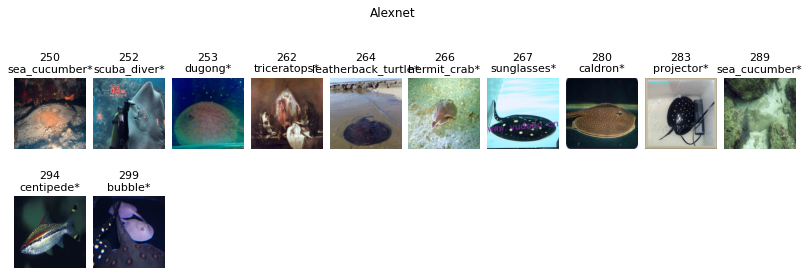

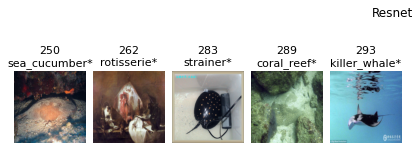

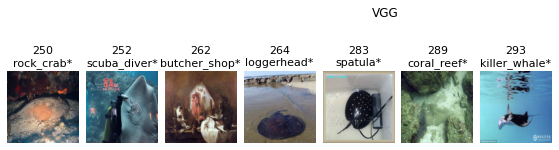


Errors made on stingray by: 


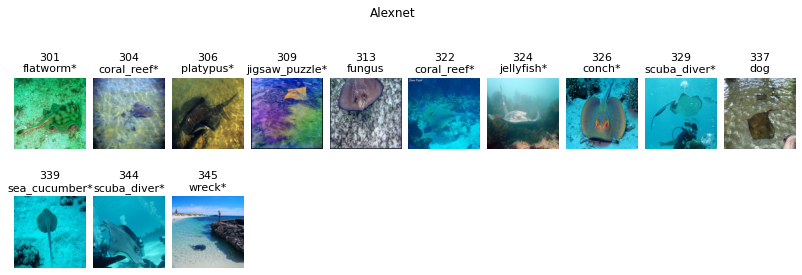

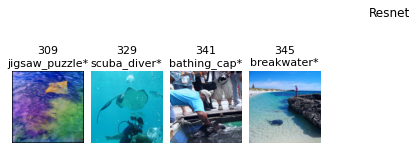

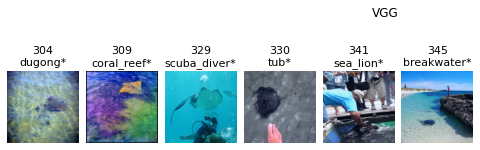


Errors made on cock by: 


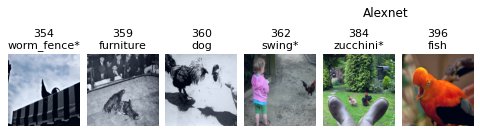

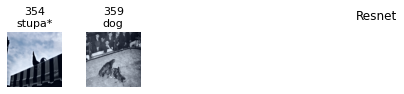

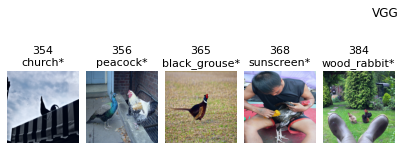


Errors made on hen by: 


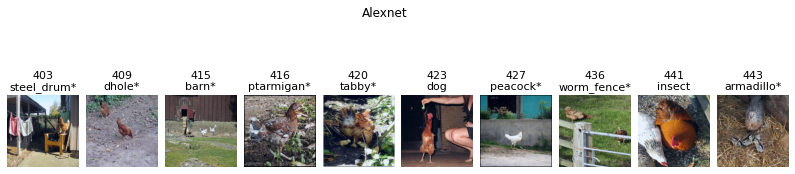

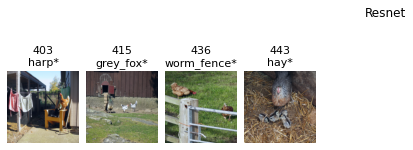

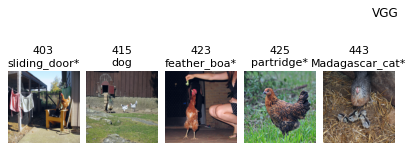


Errors made on ostrich by: 


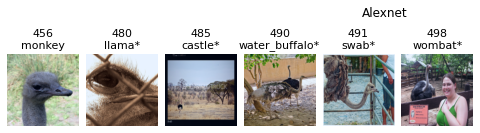

<Figure size 1008x0 with 0 Axes>

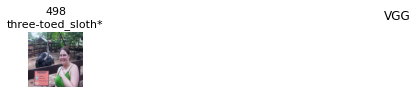


Errors made on brambling by: 


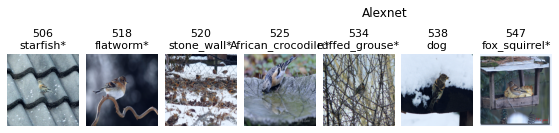

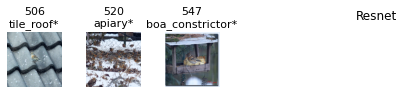

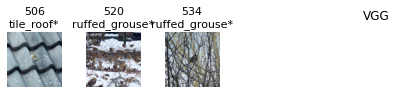


Errors made on goldfinch by: 


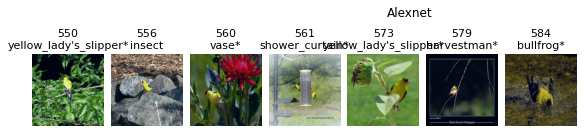

<Figure size 1008x0 with 0 Axes>

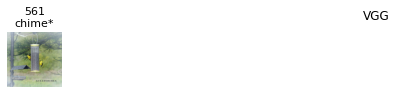


Errors made on house_finch by: 


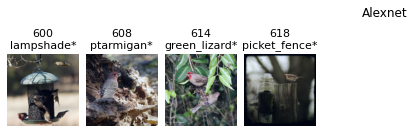

<Figure size 1008x0 with 0 Axes>

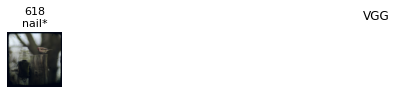


Errors made on junco by: 


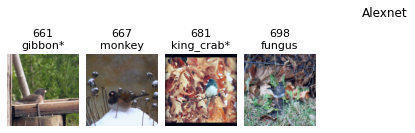

<Figure size 1008x0 with 0 Axes>

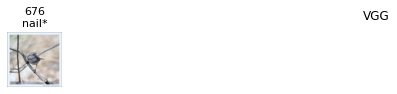


Errors made on indigo_bunting by: 


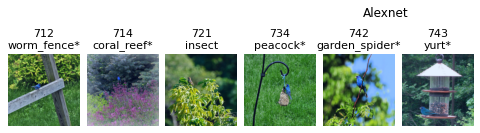

<Figure size 1008x0 with 0 Axes>

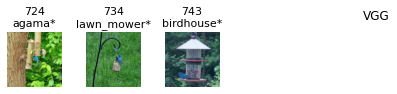


Errors made on robin by: 


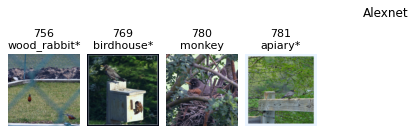

<Figure size 1008x0 with 0 Axes>

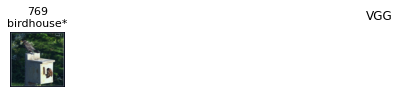

In [8]:
# plot the errors made by alexnet and resnet, the titles represent the false predictions

for class_name in err_alexnet.keys():
    
    print('\n' + '\033[1m' + 'Errors made on {} by: '.format(class_name))
    fig = plt.figure(figsize = (14, math.ceil(len(err_alexnet[class_name])/3.5)))
    plt.suptitle('Alexnet', y = 1.08)
    plt.subplots_adjust(wspace = 0.1, hspace = 0.2)
    for i, data in enumerate(err_alexnet[class_name]):
        num, false_pred = data[0], data[1]
        img = data_test[num][0].permute(1, 2, 0)
        img_norm = (img - img.min()) / (img.max() - img.min())
        plt.subplot(math.ceil(len(err_alexnet[class_name])/10), 10, i+1)
        plt.imshow(img_norm)
        plt.title(str(num) + '\n' + false_pred, fontsize = 11)
        plt.axis('off')
    plt.show()    

    fig = plt.figure(figsize = (14, math.ceil(len(err_resnet[class_name])/3.5)))
    plt.suptitle('Resnet', y = 1.2)
    plt.subplots_adjust(wspace = 0.1, hspace = 0.2)
    for i, data in enumerate(err_resnet[class_name]):
        num, false_pred = data[0], data[1]
        img = data_test[num][0].permute(1, 2, 0)
        img_norm = (img - img.min()) / (img.max() - img.min())
        plt.subplot(math.ceil(len(err_resnet[class_name])/10), 10, i+1)
        plt.imshow(img_norm)
        plt.title(str(num) + '\n' + false_pred, fontsize = 11)
        plt.axis('off')
    plt.show()
    
    fig = plt.figure(figsize = (14, math.ceil(len(err_vgg[class_name])/3.5)))
    plt.suptitle('VGG', y = 1.2)
    plt.subplots_adjust(wspace = 0.1, hspace = 0.2)
    for i, data in enumerate(err_vgg[class_name]):
        num, false_pred = data[0], data[1]
        img = data_test[num][0].permute(1, 2, 0)
        img_norm = (img - img.min()) / (img.max() - img.min())
        plt.subplot(math.ceil(len(err_vgg[class_name])/10), 10, i+1)
        plt.imshow(img_norm)
        plt.title(str(num) + '\n' + false_pred, fontsize = 11)
        plt.axis('off')
    plt.show()

##### The remaining part is not related to the current task

Testing the performance on stylized images

In [9]:
sti_name = 'filled-silhouettes'
# class_name = 'bear'

data_dir = 'texture-vs-shape-master/stimuli/' # + sti_name  + '/' + class_name + '/'

data_sti =  datasets.ImageFolder(root = data_dir, transform = transform_,
                                       target_transform = None)

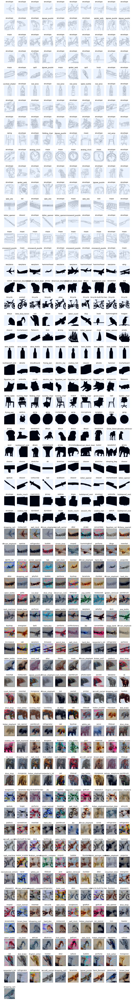

In [10]:
resnet.eval()
# pred_alex = []
plt.figure(figsize = (15, math.ceil(len(data_sti)/5)))

for i, data in enumerate(data_sti):
    img = data[0]
    pred = resnet(img.unsqueeze(0))
    pred_class = str(imagenet_classes[pred.max(dim=1)[1].item()])
    img_norm = (img - img.min()) / (img.max() - img.min())
    plt.subplot(math.ceil(len(data_sti)/10), 10, i+1)
    plt.imshow(img_norm.permute(1, 2, 0))
    plt.title(pred_class, fontsize = 11)
    plt.axis('off')
    if i == 600:
        break
plt.show()

In [11]:
# deleted codes

"""
preprocess = transforms.Compose([
   transforms.Resi
   \ze((224, 224)),
   transforms.ToTensor(),
])

class Normalize(nn.Module):
    def __init__(self, mean, std):
        super(Normalize, self).__init__()
        self.mean = torch.Tensor(mean)
        self.std = torch.Tensor(std)
    def forward(self, x):
        return (x - self.mean.type_as(x)[None,:,None,None]) / self.std.type_as(x)[None,:,None,None]

norm = Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

data_dir = 'ILSVRC2012_img_val/ILSVRC2012_val_00000008.JPEG'
test_img = Image.open(data_dir)
test_img = preprocess(test_img)[None,:,:,:]
test_img_norm = norm(test_img)

plt.imshow(test_img[0].numpy().transpose(1,2,0))

alexnet.eval()

pred = alexnet(test_img_norm)
_, predicted = torch.max(pred, 1)

with open("imagenet_class_index.json") as f:
    imagenet_classes = {int(i):x[1] for i,x in json.load(f).items()}
print('predicted label:{} '.format(int(predicted)) + str(imagenet_classes[pred.max(dim=1)[1].item()]))
print('true label:{} '.format(int(labels[0][7])) + str(imagenet_classes[int(labels[0][7])]))
"""

'\npreprocess = transforms.Compose([\n   transforms.Resi\n   \\ze((224, 224)),\n   transforms.ToTensor(),\n])\n\nclass Normalize(nn.Module):\n    def __init__(self, mean, std):\n        super(Normalize, self).__init__()\n        self.mean = torch.Tensor(mean)\n        self.std = torch.Tensor(std)\n    def forward(self, x):\n        return (x - self.mean.type_as(x)[None,:,None,None]) / self.std.type_as(x)[None,:,None,None]\n\nnorm = Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])\n\ndata_dir = \'ILSVRC2012_img_val/ILSVRC2012_val_00000008.JPEG\'\ntest_img = Image.open(data_dir)\ntest_img = preprocess(test_img)[None,:,:,:]\ntest_img_norm = norm(test_img)\n\nplt.imshow(test_img[0].numpy().transpose(1,2,0))\n\nalexnet.eval()\n\npred = alexnet(test_img_norm)\n_, predicted = torch.max(pred, 1)\n\nwith open("imagenet_class_index.json") as f:\n    imagenet_classes = {int(i):x[1] for i,x in json.load(f).items()}\nprint(\'predicted label:{} \'.format(int(predicted)) + str(imagene